## read data

In [1]:
import pandas as pd
from collections import Counter
import matplotlib.pyplot as plt
import networkx as nx
import operator

In [2]:
df = pd.read_csv('datos.csv',sep='\t')

In [3]:
df

,Apellido Paterno,Apellido Materno,Nombres,Año,Letra,Comuna,Provincia,Región,Sexo,Oficina
0,PADILLA,RODRÍGUEZ,ANGÉLICA ASUNCIÓN,1994,b),TEMUCO,CAUTÍN,REGIÓN DE LA ARAUCANIA,Femenino,SUBDIRECCIÓN NACIONAL TEMUCO
1,ANTILEO,JARAMILLO,TERESA DEL CARMEN,1994,a),TEODORO SCHMIDT,CAUTÍN,REGIÓN DE LA ARAUCANIA,Femenino,SUBDIRECCIÓN NACIONAL TEMUCO
2,RIVERA,s/i,MARIA ALEJANDRA,1994,b),VILLARRICA,CAUTÍN,REGIÓN DE LA ARAUCANIA,Femenino,SUBDIRECCIÓN NACIONAL TEMUCO
3,SANHUEZA,SANHUEZA,MARTA DEL CARMEN,1994,b),VILLARRICA,CAUTÍN,REGIÓN DE LA ARAUCANIA,Femenino,SUBDIRECCIÓN NACIONAL TEMUCO
4,ABURTO,PALMA,BERNARDO JESÚS,2001,a),PERQUENCO,CAUTÍN,REGIÓN DE LA ARAUCANIA,Masculino,SUBDIRECCIÓN NACIONAL TEMUCO
5,TORO,SOTO,ANDRÉS,1994,b),TEMUCO,CAUTÍN,REGIÓN DE LA ARAUCANIA,Masculino,SUBDIRECCIÓN NACIONAL TEMUCO
6,VIDAL,BENAVENTE,ETELVINA DEL CARMEN,1994,b),NUEVA IMPERIAL,CAUTÍN,REGIÓN DE LA ARAUCANIA,Femenino,SUBDIRECCIÓN NACIONAL TEMUCO
7,CHÁVEZ,ESCOBAR,JUAN ALBERTO,1996,a),TEMUCO,CAUTÍN,REGIÓN DE LA ARAUCANIA,Masculino,SUBDIRECCIÓN NACIONAL TEMUCO
8,MORENO,GONZÁLEZ,JOSÉ EUSEBIO,1994,b),TEMUCO,CAUTÍN,REGIÓN DE LA ARAUCANIA,Masculino,SUBDIRECCIÓN NACIONAL TEMUCO
9,ROMERO,BEMAVENTE,SEGUNDO PEDRO,1994,b),TEMUCO,CAUTÍN,REGIÓN DE LA ARAUCANIA,Masculino,SUBDIRECCIÓN NACIONAL TEMUCO


## basic statistics

In [4]:
## count frequency by year

years=[y for y in df.Año]
counts=dict(Counter(years))
counts={k: v for k, v in sorted(counts.items(), key=lambda item: item[0])}

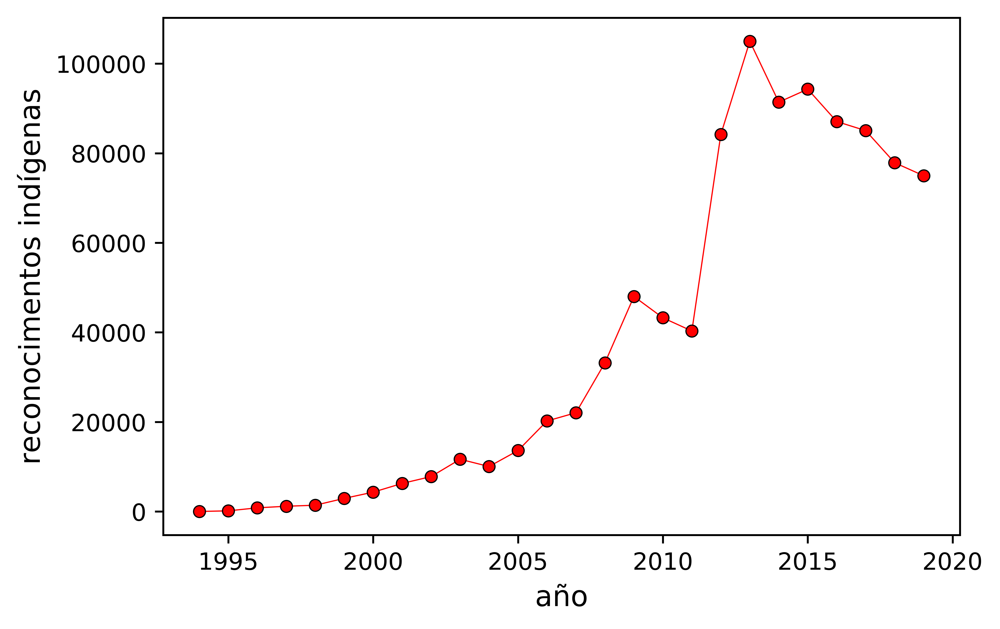

In [5]:
fig, ax = plt.subplots(dpi=800)

#for language in romance_names:

plt.plot(counts.keys(),counts.values(),marker='o',color='r',markersize=5,markeredgecolor='k',markeredgewidth=0.5,fillstyle='full',clip_on=True,linewidth=0.5)

plt.grid(False)
#plt.legend(loc='best')
#plt.xlim([-4.25,7.25])
#plt.ylim([-1.75,2.25])
plt.ylabel(r'reconocimentos indígenas',fontsize=12)
plt.xlabel(r'año',fontsize=12)
plt.rcParams.update({'font.size': 10})
plt.savefig('frecuencia_reconocimientos.pdf', format='pdf', transparent=True, bbox_inches='tight',dpi=800)
plt.show()

## some statistics by year

In [6]:
## count letters by year

letters=[l for l in df.Letra]

In [7]:
letters

['b)',
 'a)',
 'b)',
 'b)',
 'a)',
 'b)',
 'b)',
 'a)',
 'b)',
 'b)',
 'b)',
 'b)',
 'b)',
 'c) Autoidentificación Conyuge Indígena',
 'b)',
 'b)',
 'a)',
 'a)',
 'c) Autoidentificación Conyuge Indígena',
 'b)',
 'b)',
 'c) Autoidentificación Conyuge Indígena',
 'b)',
 'a)',
 'a)',
 'a)',
 'b)',
 'a)',
 'b)',
 'c) Autoidentificación Conyuge Indígena',
 'b)',
 'b)',
 'b)',
 'a)',
 'b)',
 'a)',
 'b)',
 'a)',
 'a)',
 'c) Autoidentificación Conyuge Indígena',
 'b)',
 'b)',
 'b)',
 'b)',
 'c) Autoidentificación Conyuge Indígena',
 'b)',
 'b)',
 'c) Autoidentificación Conyuge Indígena',
 'b)',
 'b)',
 'c) Autoidentificación Conyuge Indígena',
 'c)',
 'a)',
 'c) Autoidentificación Conyuge Indígena',
 'a)',
 'b)',
 'c) Autoidentificación Conyuge Indígena',
 'c) Autoidentificación Conyuge Indígena',
 'c) Autoidentificación Conyuge Indígena',
 'c) Autoidentificación Conyuge Indígena',
 'c) Autoidentificación Conyuge Indígena',
 'b)',
 'b)',
 'a)',
 'a)',
 'a)',
 'b)',
 'a)',
 'a)',
 'a)',
 'b)',

In [8]:
L=[]

for l in letters:
    if l.startswith('c)'):
        L+=['c)']
    else:
        L+=[l]

In [9]:
letters_count={l:[] for l in list(set(L))} 

for i in range(len(L)):
    letters_count[L[i]]+=[years[i]]

In [10]:
letters_count={key:dict(Counter(letters_count[key])) for key in letters_count.keys()}

In [11]:
letters_count={key:{k: v for k, v in sorted(letters_count[key].items(), key=lambda item: item[0])} for key in letters_count.keys()}

In [12]:
letters_count

{'a)': {1994: 2,
  1995: 26,
  1996: 187,
  1997: 272,
  1998: 303,
  1999: 604,
  2000: 850,
  2001: 2039,
  2002: 2666,
  2003: 3633,
  2004: 2965,
  2005: 5137,
  2006: 8740,
  2007: 9100,
  2008: 14230,
  2009: 18061,
  2010: 13909,
  2011: 9873,
  2012: 13350,
  2013: 15236,
  2014: 12882,
  2015: 14829,
  2016: 14821,
  2017: 15507,
  2018: 11963,
  2019: 8069},
 'b)': {1994: 10,
  1995: 96,
  1996: 569,
  1997: 842,
  1998: 1017,
  1999: 2082,
  2000: 3218,
  2001: 3983,
  2002: 4811,
  2003: 7475,
  2004: 6564,
  2005: 8005,
  2006: 10807,
  2007: 12231,
  2008: 18146,
  2009: 28827,
  2010: 28313,
  2011: 29576,
  2012: 69534,
  2013: 88134,
  2014: 76658,
  2015: 77526,
  2016: 70323,
  2017: 67597,
  2018: 64247,
  2019: 65227},
 'c)': {1995: 27,
  1996: 65,
  1997: 60,
  1998: 84,
  1999: 243,
  2000: 254,
  2001: 250,
  2002: 325,
  2003: 560,
  2004: 518,
  2005: 474,
  2006: 668,
  2007: 725,
  2008: 831,
  2009: 1129,
  2010: 1029,
  2011: 858,
  2012: 1322,
  2013: 163

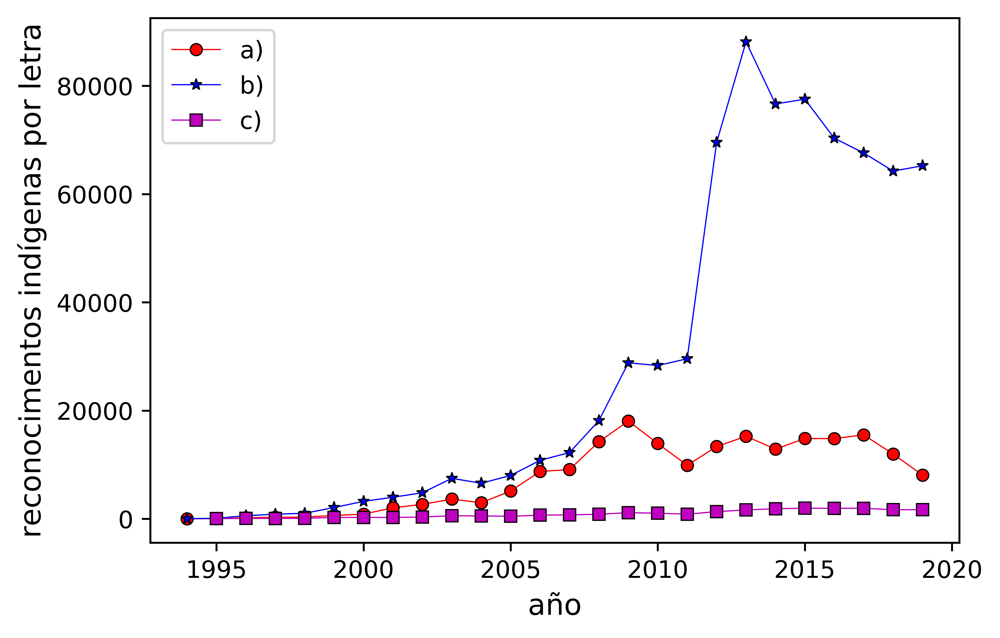

In [13]:
fig, ax = plt.subplots(dpi=800)

#for language in romance_names:

plt.plot(letters_count['a)'].keys(),letters_count['a)'].values(),marker='o',color='r',markersize=5,markeredgecolor='k',markeredgewidth=0.5,fillstyle='full',clip_on=True,linewidth=0.5,label='a)')
plt.plot(letters_count['b)'].keys(),letters_count['b)'].values(),marker='*',color='b',markersize=5,markeredgecolor='k',markeredgewidth=0.5,fillstyle='full',clip_on=True,linewidth=0.5,label='b)')
plt.plot(letters_count['c)'].keys(),letters_count['c)'].values(),marker='s',color='m',markersize=5,markeredgecolor='k',markeredgewidth=0.5,fillstyle='full',clip_on=True,linewidth=0.5,label='c)')

plt.grid(False)
plt.legend(loc='best')
#plt.xlim([-4.25,7.25])
#plt.ylim([-1.75,2.25])
plt.ylabel(r'reconocimentos indígenas por letra',fontsize=12)
plt.xlabel(r'año',fontsize=12)
plt.rcParams.update({'font.size': 10})
plt.savefig('frecuencia_reconocimientos_letra.pdf', format='pdf', transparent=True, bbox_inches='tight',dpi=800)
plt.show()

In [14]:
## count regions by year

regions=[r for r in df.Región]

In [15]:
set(regions)

{'DEL LIBERTADOR GENERAL BERNARDO OHIGGINS',
 'ISLA DE PASCUA',
 'REGIÓN DE ANTOFAGASTA',
 'REGIÓN DE ARICA PARINACOTA',
 'REGIÓN DE ATACAMA',
 'REGIÓN DE AYSÉN DEL GENERAL CARLOS IBÁÑEZ DEL CAMPO',
 'REGIÓN DE COQUIMBO',
 'REGIÓN DE LA ARAUCANIA',
 'REGIÓN DE LOS LAGOS',
 'REGIÓN DE LOS RIOS',
 'REGIÓN DE MAGALLANES Y DE LA ANTÁRTICA CHILENA',
 'REGIÓN DE TARAPACÁ.',
 'REGIÓN DE VALPARAISO',
 'REGIÓN DEL BÍO BÍO',
 'REGIÓN METROPOLITANA DE SANTIAGO',
 'REGIÓN ÑUBLE',
 'SIN INFORMACION',
 'VII REGION MAULE'}

In [16]:
regions_count={r:[] for r in list(set(regions))} 

for i in range(len(regions)):
    regions_count[regions[i]]+=[years[i]]

In [17]:
regions_count={key:dict(Counter(regions_count[key])) for key in regions_count.keys()}

In [18]:
regions_count={key:{k: v for k, v in sorted(regions_count[key].items(), key=lambda item: item[0])} for key in regions_count.keys()}

In [19]:
regions_count

{'REGIÓN METROPOLITANA DE SANTIAGO': {1995: 6,
  1996: 97,
  1997: 191,
  1998: 129,
  1999: 425,
  2000: 582,
  2001: 521,
  2002: 655,
  2003: 1040,
  2004: 1330,
  2005: 1995,
  2006: 3796,
  2007: 3765,
  2008: 7710,
  2009: 11045,
  2010: 5018,
  2011: 5775,
  2012: 12762,
  2013: 24870,
  2014: 21996,
  2015: 20205,
  2016: 18198,
  2017: 18773,
  2018: 17386,
  2019: 15653},
 'REGIÓN ÑUBLE': {1996: 21,
  1997: 2,
  1999: 5,
  2001: 31,
  2002: 2,
  2003: 4,
  2004: 11,
  2005: 13,
  2006: 45,
  2007: 48,
  2008: 63,
  2009: 352,
  2010: 269,
  2011: 338,
  2012: 938,
  2013: 706,
  2014: 649,
  2015: 893,
  2016: 717,
  2017: 627,
  2018: 551,
  2019: 250},
 'REGIÓN DE ATACAMA': {1996: 1,
  1999: 1,
  2001: 81,
  2003: 47,
  2004: 101,
  2005: 146,
  2006: 692,
  2007: 1373,
  2008: 1521,
  2009: 2507,
  2010: 3178,
  2011: 2542,
  2012: 2627,
  2013: 2483,
  2014: 3012,
  2015: 3401,
  2016: 2724,
  2017: 3441,
  2018: 3312,
  2019: 4690},
 'REGIÓN DE ANTOFAGASTA': {1995: 12,
 

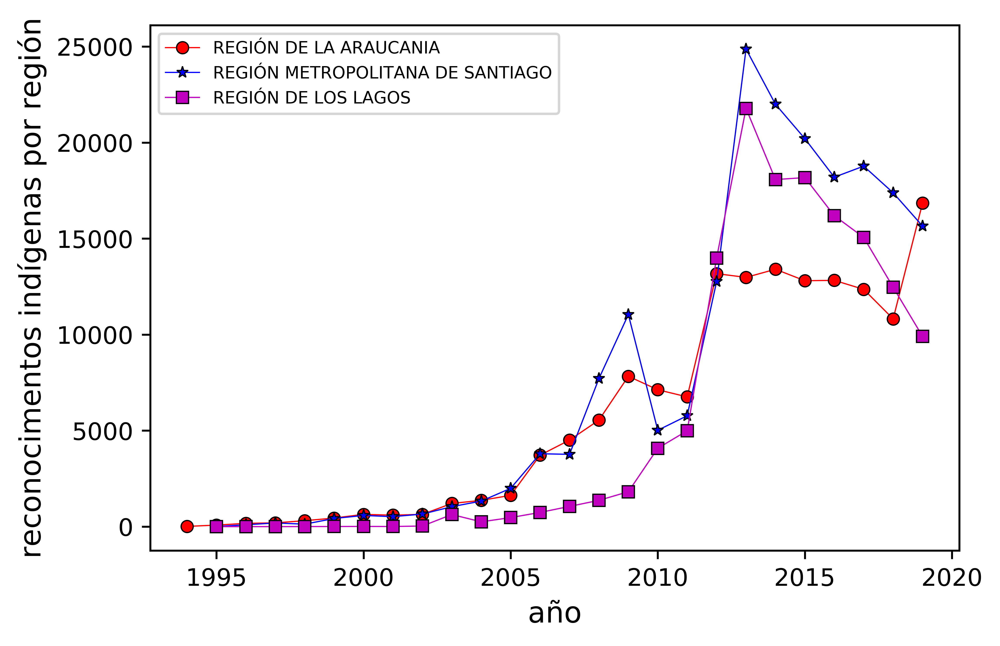

In [20]:
fig, ax = plt.subplots(dpi=800)

#for language in romance_names:

colors={'REGIÓN DE LA ARAUCANIA':['o','r'],'REGIÓN METROPOLITANA DE SANTIAGO':['*','b'],'REGIÓN DE LOS LAGOS':['s','m']}

for key in colors.keys():#regions_count.keys():

    plt.plot(regions_count[key].keys(),regions_count[key].values(),marker=colors[key][0],color=colors[key][1],markersize=5,markeredgecolor='k',markeredgewidth=0.5,fillstyle='full',clip_on=True,linewidth=0.5,label=key)

plt.grid(False)
plt.legend(loc='best',fontsize=7)
#plt.xlim([-4.25,7.25])
#plt.ylim([-1.75,2.25])
plt.ylabel(r'reconocimentos indígenas por región',fontsize=12)
plt.xlabel(r'año',fontsize=12)
plt.rcParams.update({'font.size': 10})
plt.savefig('frecuencia_reconocimientos_region.pdf', format='pdf', transparent=True, bbox_inches='tight',dpi=800)
plt.show()

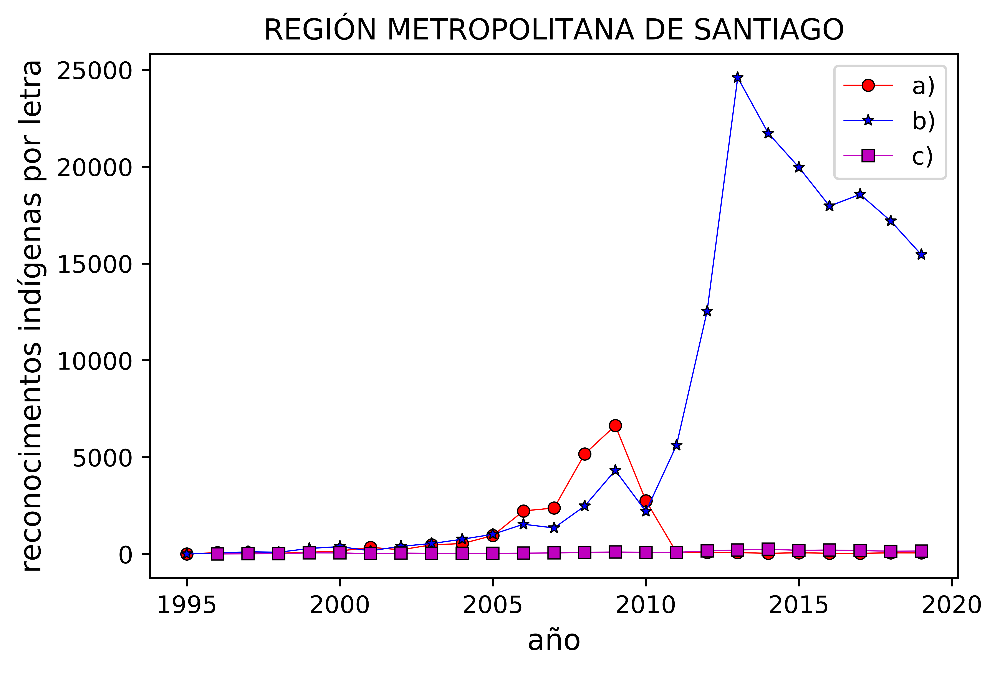

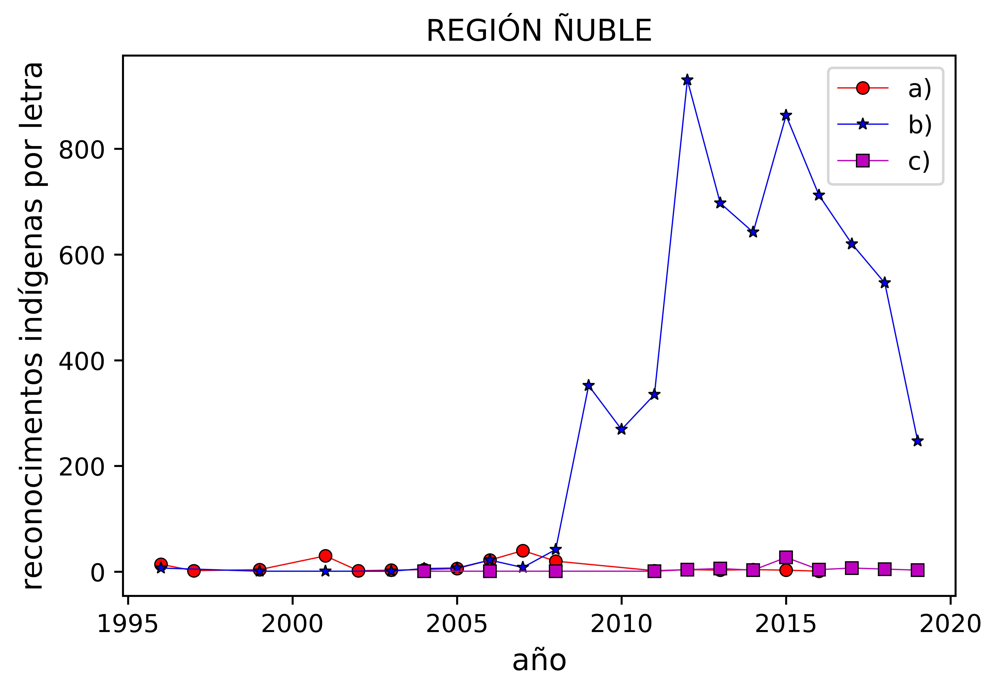

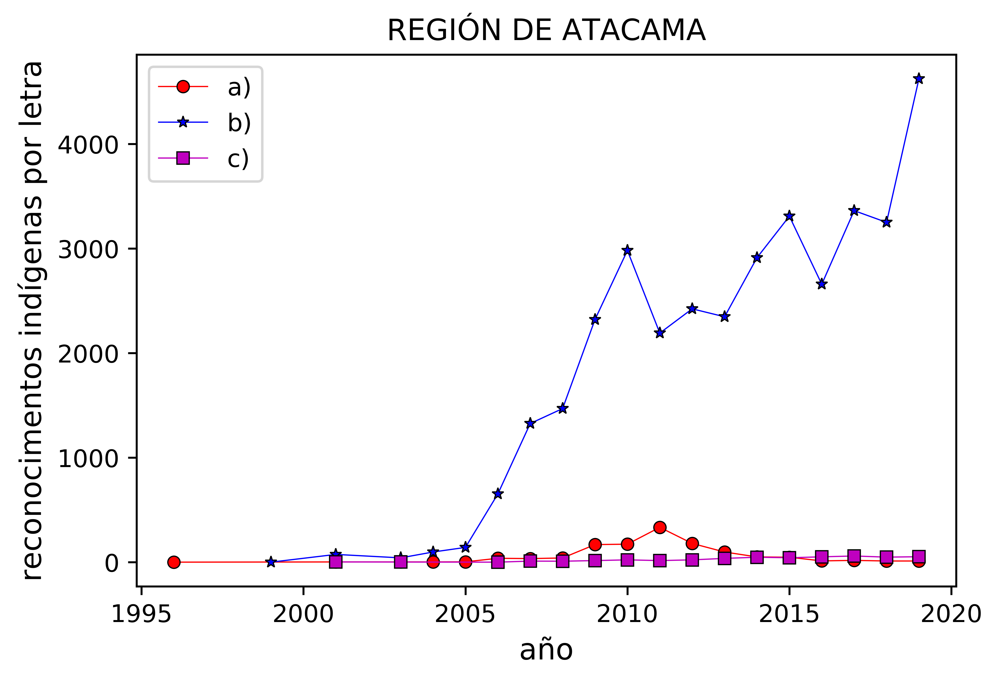

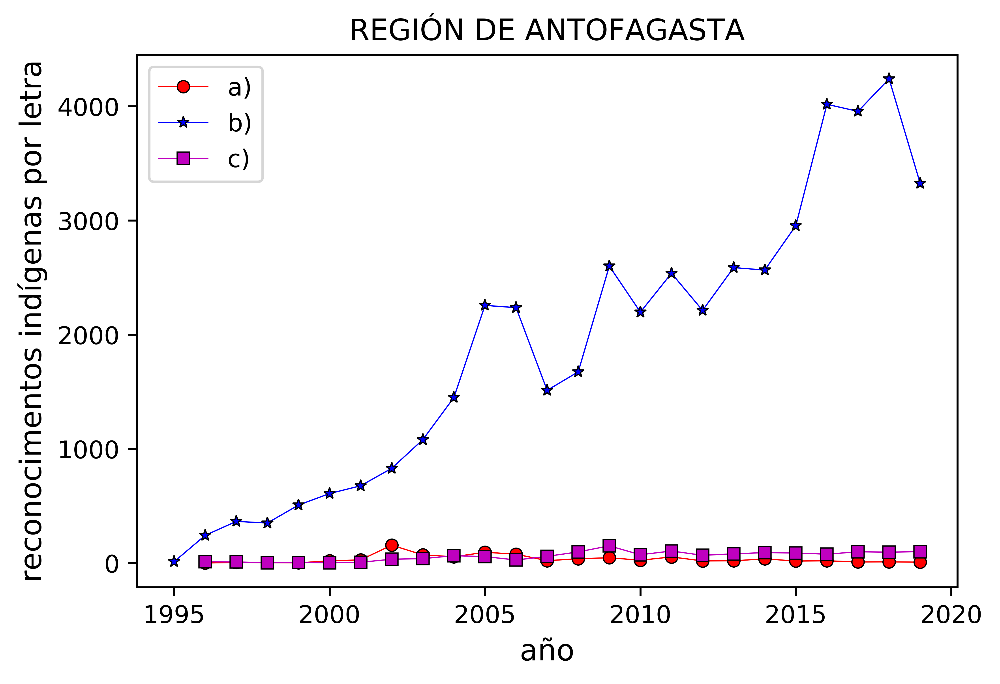

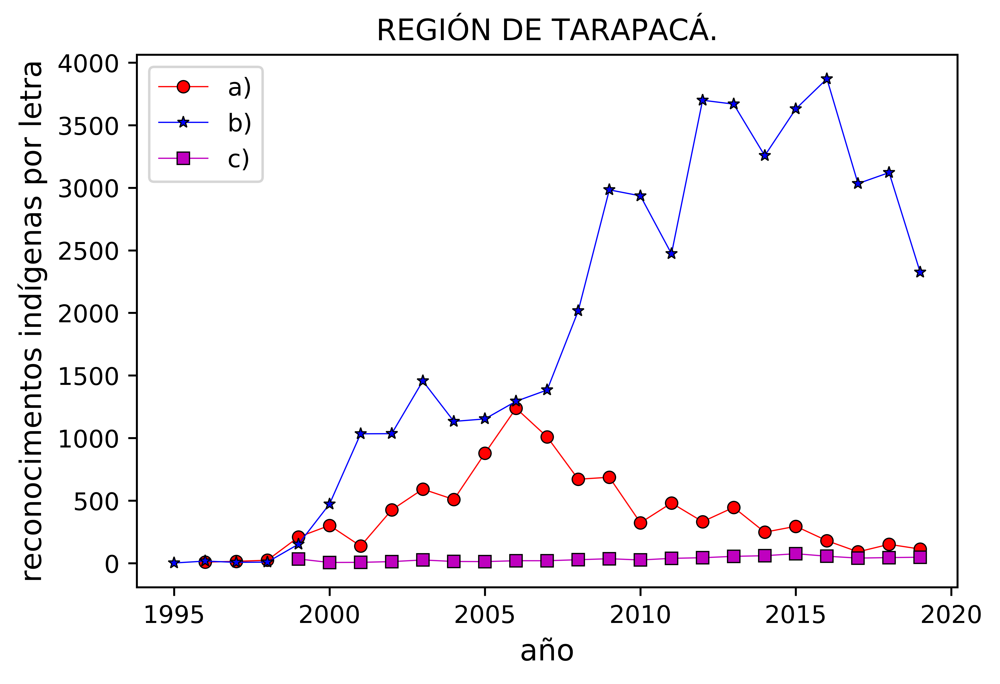

...

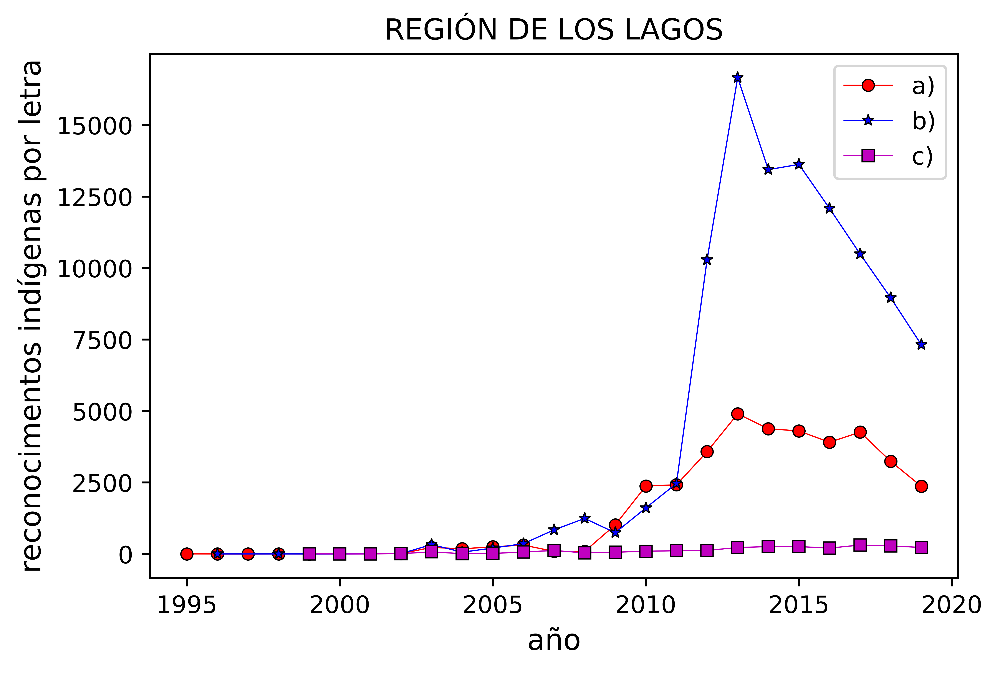

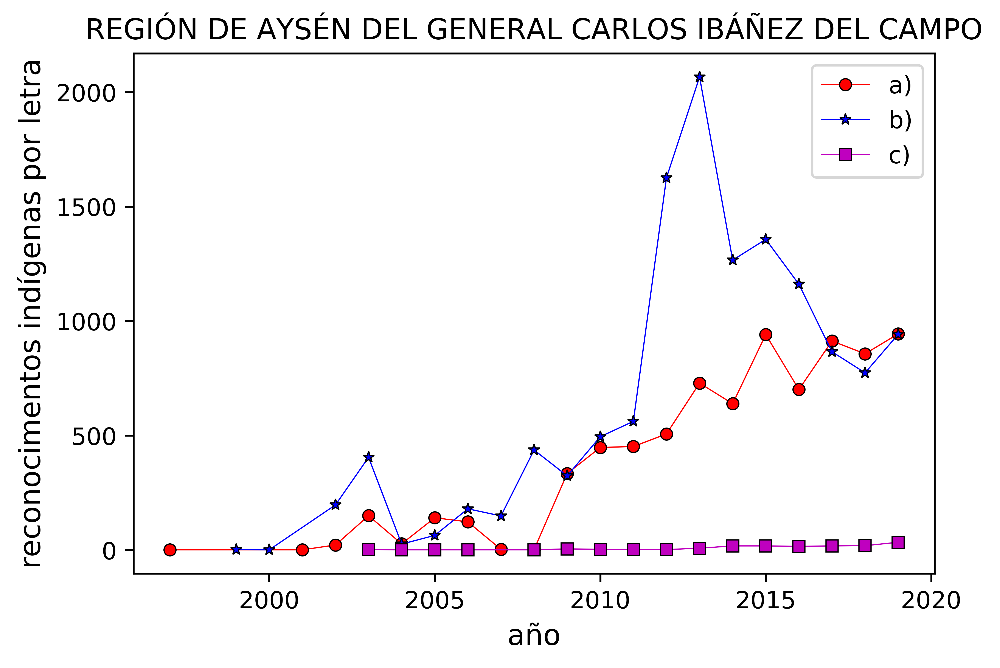

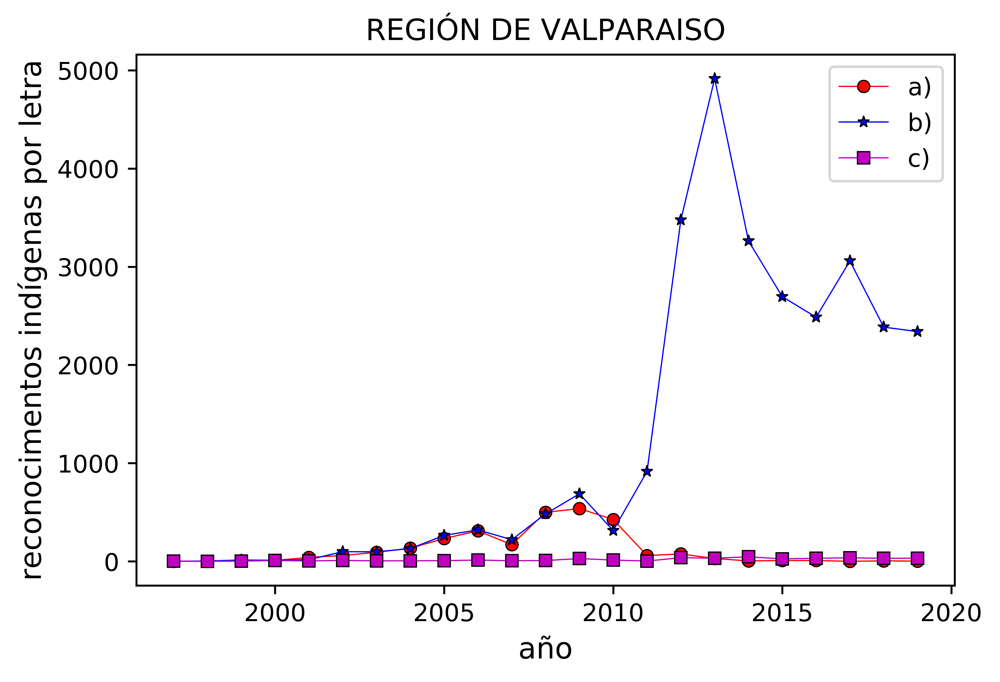

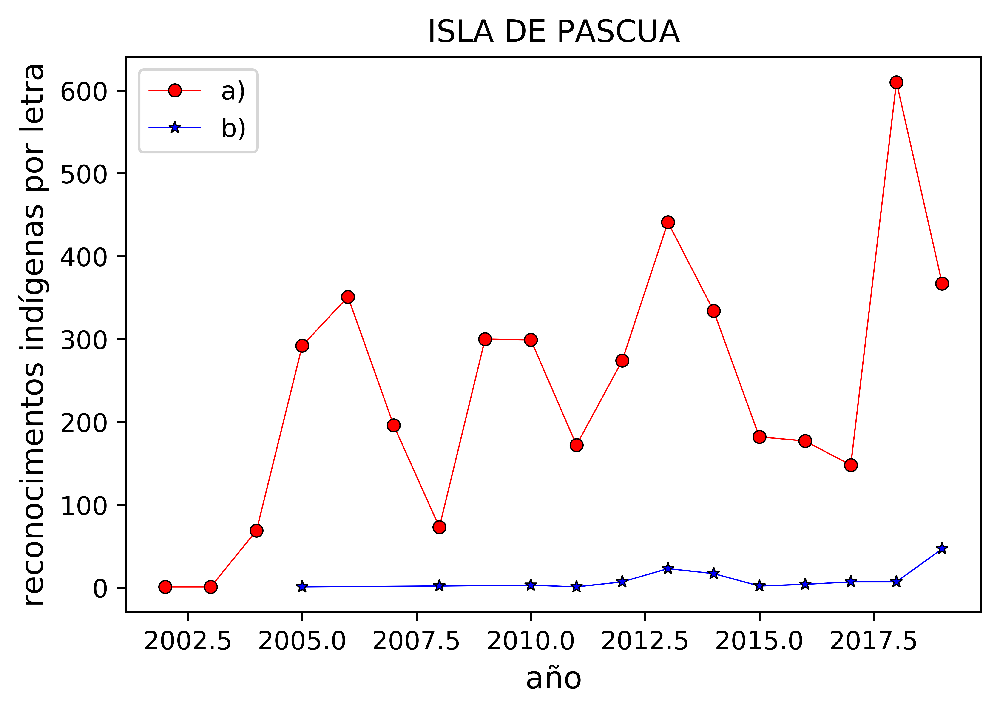

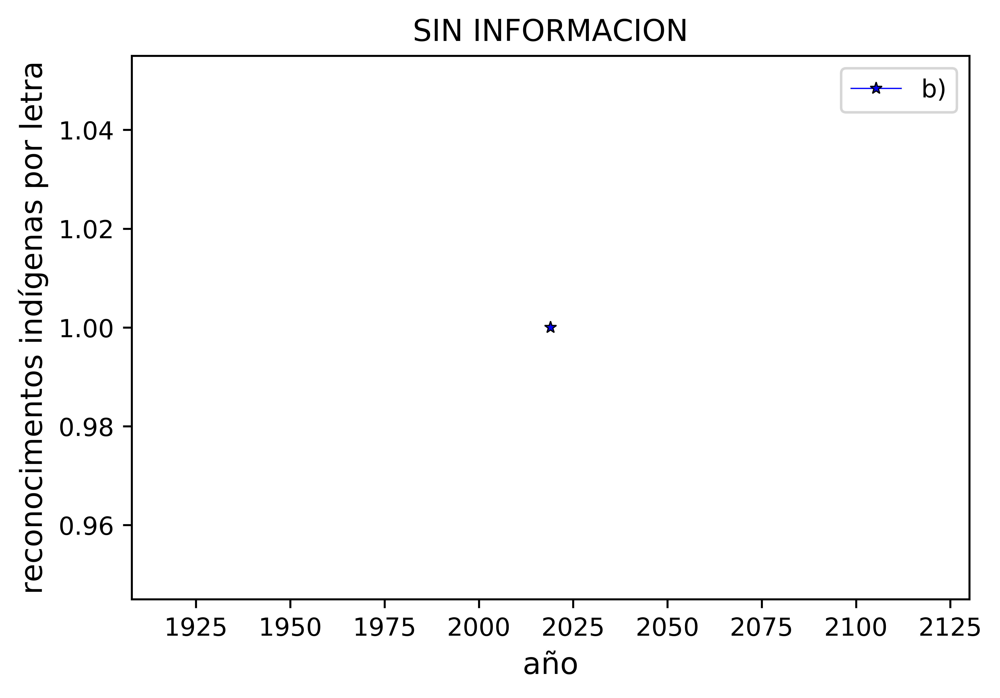

In [21]:
## counts by year by region

for region in set(regions):

    letters=[l for l in df[df.Región==region].Letra]
    years=[y for y in df[df.Región==region].Año]
    
    L=[]

    for l in letters:
        if l.startswith('c)'):
            L+=['c)']
        else:
            L+=[l]
            
    letters_count={l:[] for l in list(set(L))} 

    for i in range(len(L)):
        letters_count[L[i]]+=[years[i]]
        
    letters_count={key:dict(Counter(letters_count[key])) for key in letters_count.keys()}
    letters_count={key:{k: v for k, v in sorted(letters_count[key].items(), key=lambda item: item[0])} for key in letters_count.keys()}
    
    fig, ax = plt.subplots(dpi=800)

    if 'a)' in letters_count.keys():
        plt.plot(letters_count['a)'].keys(),letters_count['a)'].values(),marker='o',color='r',markersize=5,markeredgecolor='k',markeredgewidth=0.5,fillstyle='full',clip_on=True,linewidth=0.5,label='a)')
    if 'b)' in letters_count.keys():
        plt.plot(letters_count['b)'].keys(),letters_count['b)'].values(),marker='*',color='b',markersize=5,markeredgecolor='k',markeredgewidth=0.5,fillstyle='full',clip_on=True,linewidth=0.5,label='b)')
    if 'c)' in letters_count.keys():
        plt.plot(letters_count['c)'].keys(),letters_count['c)'].values(),marker='s',color='m',markersize=5,markeredgecolor='k',markeredgewidth=0.5,fillstyle='full',clip_on=True,linewidth=0.5,label='c)')

    plt.grid(False)
    plt.legend(loc='best')
    plt.title(region)
    #plt.xlim([-4.25,7.25])
    #plt.ylim([-1.75,2.25])
    plt.ylabel(r'reconocimentos indígenas por letra',fontsize=12)
    plt.xlabel(r'año',fontsize=12)
    plt.rcParams.update({'font.size': 10})
    plt.savefig('frecuencia_reconocimientos_letra_'+region+'.pdf', format='pdf', transparent=True, bbox_inches='tight',dpi=800)
    plt.show()

## some networks :)

In [24]:
first_surname=[a for a in df['Apellido Paterno']]

In [25]:
second_surname=[a for a in df['Apellido Materno']]

In [35]:
years=[y for y in df.Año]

In [36]:
triple=[[a,b,c] for a,b,c in zip(first_surname,second_surname,years)]

In [38]:
surname_year={y:[] for y in set(years)}

In [39]:
for item in triple:
    surname_year[item[2]]+=[(item[0],item[1])]

In [42]:
def GRAPH(year):
    
    G=nx.Graph()
    surnames=surname_year[year]
    for item in surnames:
        if G.has_edge(item[0],item[1])==False:
            G.add_edge(item[0],item[1],weight=1)
        else:
            x=G[item[0]][item[1]]['weight']
            G[item[0]][item[1]]['weight']=x+1
                  
    return G

In [49]:
G=GRAPH(2010)

In [50]:
len(G)

9146

In [51]:
def plot_graph(G):
    
    G.remove_edges_from(nx.selfloop_edges(G))
    G=nx.k_core(G)
    G=nx.maximum_spanning_tree(G,weight='weight')
    eigen_centrality = nx.eigenvector_centrality(G,weight='weight',max_iter=10000)
    sorted_centrality = list(zip(*sorted(eigen_centrality.items(), key=operator.itemgetter(1),reverse=True)[:30]))[0]
    node_sizes=list(eigen_centrality.values())
   
    pos = nx.kamada_kawai_layout(G)
    labels={i:i for i in sorted_centrality}
    nx.draw_networkx_nodes(G, pos, node_size = [1000*(x+0.01) for x in node_sizes], node_color='orange',linewidths=0.1,alpha=0.85) 
    nx.draw_networkx_edges(G, pos, alpha=0.65,width=0.1,edge_color='cyan')
    nx.draw_networkx_labels(G,pos,labels,alpha=0.65,font_size=4,font_color='k',font_family='monospace')
    plt.axis('off')
    #plt.title('Constitución de '+country,fontname="Arial",fontsize=9)
    plt.savefig('bipartite.pdf', format='pdf', transparent=True, bbox_inches='tight',dpi=1080)
    plt.show()

In [ ]:
plot_graph(G)

In [ ]:
len(G)